In [1]:
! pip install missingno

In [2]:
#####import libraries

#data wrangling

import missingno as msno
import pandas as pd
import numpy as np


#data visualisation

import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8) #Adjusts the configuration of the plots we will create

#read in the data

df= pd.read_csv(r'C:\Users\pguen\OneDrive\Documents\Pricing & data anlayst\Portfolio Of Projects\LondonHousingMarket.csv')

In [3]:
df.head()

,date,area,average_price,code,houses_sold,no_of_crimes,borough_flag
0,01/01/1995,city of london,91449,E09000001,17.0,NaN,1
1,01/02/1995,city of london,82203,E09000001,7.0,NaN,1
2,01/03/1995,city of london,79121,E09000001,14.0,NaN,1
3,01/04/1995,city of london,77101,E09000001,7.0,NaN,1
4,01/05/1995,city of london,84409,E09000001,1.0,NaN,1


In [4]:
df.shape

(13549, 7)

In [5]:
# missing data

for i in df.columns:
    pct_missing = np.mean(df[i].isnull())
    print('{} - {}%'.format(i,pct_missing))

date - 0.0%
area - 0.0%
average_price - 0.0%
code - 0.0%
houses_sold - 0.006937781386080154%
no_of_crimes - 0.45863163333087315%
borough_flag - 0.0%


<AxesSubplot:>

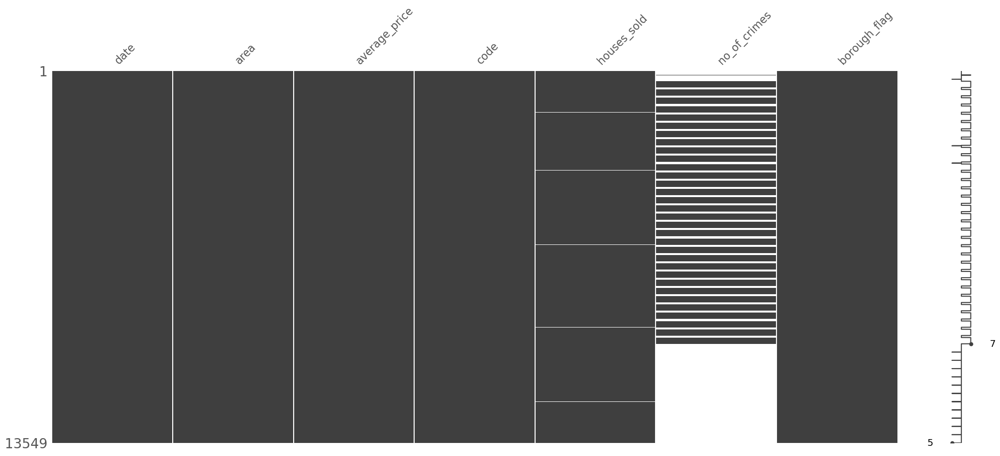

In [6]:
#visualisation of missing values

msno.matrix(df)

In [35]:
#Let's fill NaN values with mean
df = df.fillna(df['no_of_crimes'].mean())
df = df.fillna(df['houses_sold'].mean())
df.head()

,date,area,average_price,code,houses_sold,no_of_crimes,borough_flag
0,01/01/1995,city of london,91449,E09000001,17,1630,1
1,01/02/1995,city of london,82203,E09000001,7,1630,1
2,01/03/1995,city of london,79121,E09000001,14,1630,1
3,01/04/1995,city of london,77101,E09000001,7,1630,1
4,01/05/1995,city of london,84409,E09000001,1,1630,1


In [20]:
# change data type columns:remove decimal points

df['houses_sold'] = df['houses_sold'].astype('int64')

df['no_of_crimes'] = df['no_of_crimes'].astype('int64')


In [21]:
df.head()

,date,area,average_price,code,houses_sold,no_of_crimes,borough_flag
0,01/01/1995,city of london,91449,E09000001,17,1630,1
1,01/02/1995,city of london,82203,E09000001,7,1630,1
2,01/03/1995,city of london,79121,E09000001,14,1630,1
3,01/04/1995,city of london,77101,E09000001,7,1630,1
4,01/05/1995,city of london,84409,E09000001,1,1630,1


In [22]:
# display all data
pd.set_option('display.max_rows',None)

In [23]:
df

,date,area,average_price,code,houses_sold,no_of_crimes,borough_flag
0,01/01/1995,city of london,91449,E09000001,17,1630,1
1,01/02/1995,city of london,82203,E09000001,7,1630,1
2,01/03/1995,city of london,79121,E09000001,14,1630,1
3,01/04/1995,city of london,77101,E09000001,7,1630,1
4,01/05/1995,city of london,84409,E09000001,1,1630,1
5,01/06/1995,city of london,94901,E09000001,17,1630,1
6,01/07/1995,city of london,110128,E09000001,13,1630,1
7,01/08/1995,city of london,112329,E09000001,14,1630,1
8,01/09/1995,city of london,104473,E09000001,17,1630,1
9,01/10/1995,city of london,108038,E09000001,14,1630,1


In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13549 entries, 0 to 13548
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   date           13549 non-null  object
 1   area           13549 non-null  object
 2   average_price  13549 non-null  int64 
 3   code           13549 non-null  object
 4   houses_sold    13549 non-null  int64 
 5   no_of_crimes   13549 non-null  int64 
 6   borough_flag   13549 non-null  int64 
dtypes: int64(4), object(3)
memory usage: 741.1+ KB


In [37]:
#check for duplicates

new_output = df.duplicated()
print("Duplicated values:",new_output)

Duplicated values: 0        False
1        False
2        False
3        False
4        False
5        False
6        False
7        False
8        False
9        False
10       False
11       False
12       False
13       False
14       False
15       False
16       False
17       False
18       False
19       False
20       False
21       False
22       False
23       False
24       False
25       False
26       False
27       False
28       False
29       False
30       False
31       False
32       False
33       False
34       False
35       False
36       False
37       False
38       False
39       False
40       False
41       False
42       False
43       False
44       False
45       False
46       False
47       False
48       False
49       False
50       False
51       False
52       False
53       False
54       False
55       False
56       False
57       False
58       False
59       False
60       False
61       False
62       False
63       False
64       False
65    

In [27]:
#order by average price

df.sort_values(by=['houses_sold'], inplace=False, ascending=False)

,date,area,average_price,code,houses_sold,no_of_crimes,borough_flag
13336,01/05/2002,england,104458,E92000001,132163,1630,0
13362,01/07/2004,england,156730,E92000001,126778,1630,0
13338,01/07/2002,england,110001,E92000001,126475,1630,0
13327,01/08/2001,england,93331,E92000001,124849,1630,0
13399,01/08/2007,england,194328,E92000001,121246,1630,0
13353,01/10/2003,england,135885,E92000001,119798,1630,0
13302,01/07/1999,england,70612,E92000001,119652,1630,0
13391,01/12/2006,england,182031,E92000001,119458,1630,0
13361,01/06/2004,england,153527,E92000001,118877,1630,0
13387,01/08/2006,england,177603,E92000001,118684,1630,0


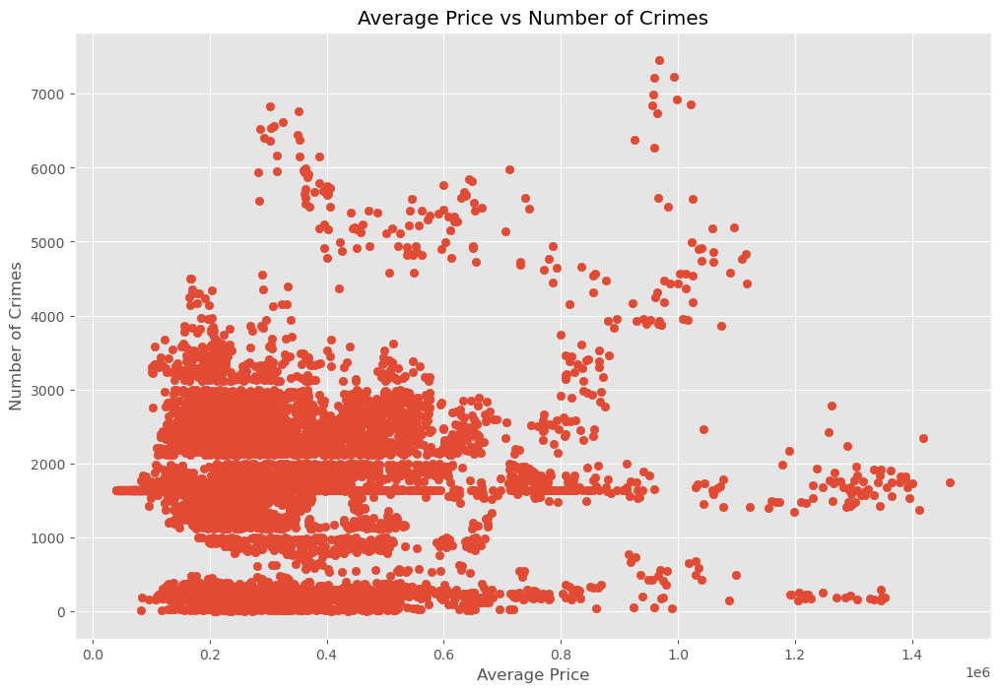

In [38]:
#scatter plot with houses_sold vs number of crimes

plt.scatter(x=df['average_price'], y=df['no_of_crimes'])

plt.title('Average Price vs Number of Crimes')

plt.xlabel('Average Price')

plt.ylabel('Number of Crimes')

plt.show()

<AxesSubplot:xlabel='average_price', ylabel='no_of_crimes'>

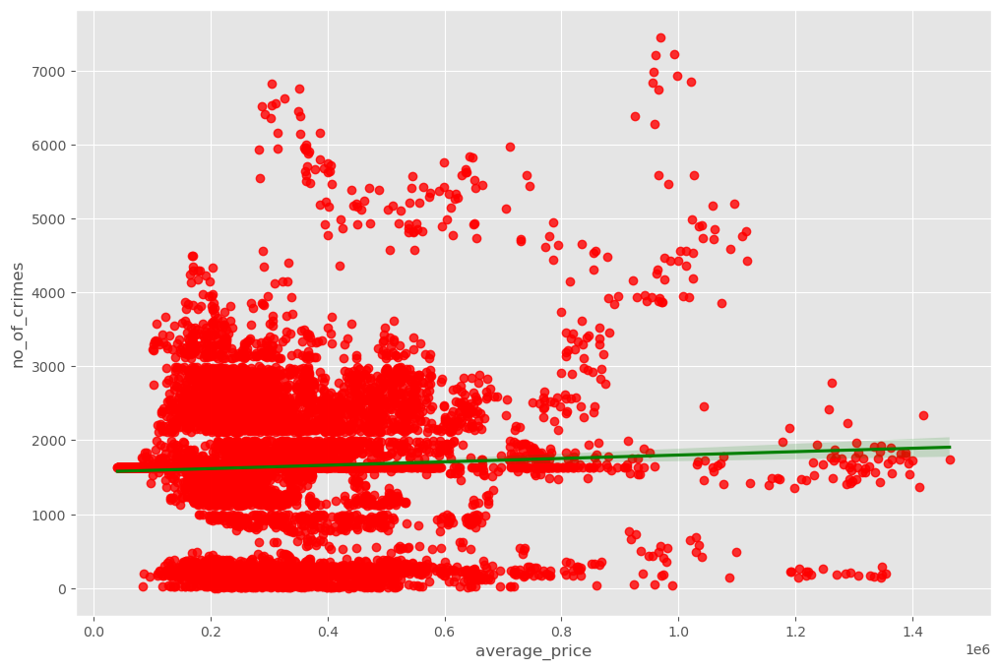

In [39]:
#plot average price vs number of crimes using seaborn

sns.regplot(x='average_price', y='no_of_crimes', data =df, scatter_kws={"color":"red"},line_kws = {"color":"green"})

In [40]:
#let's start looking at correlation

df.corr(method='pearson')

,average_price,houses_sold,no_of_crimes,borough_flag
average_price,1.000000,-0.141349,0.050524,0.293271
houses_sold,-0.141349,1.000000,0.000899,-0.413245
no_of_crimes,0.050524,0.000899,1.000000,0.000378
borough_flag,0.293271,-0.413245,0.000378,1.000000


Text(120.58159722222221, 0.5, 'London Housing features')

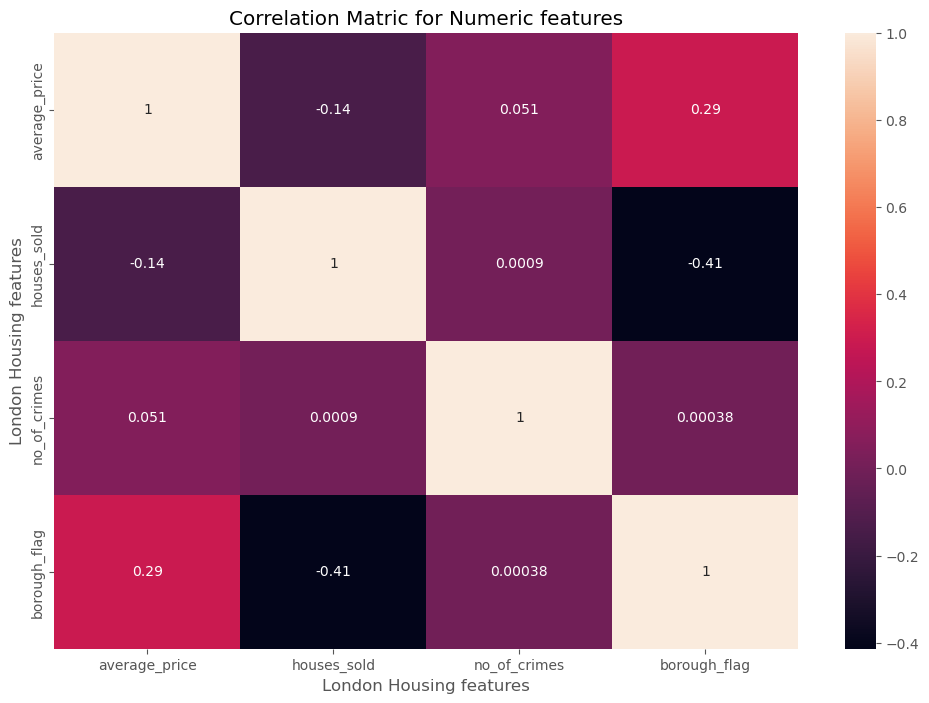

In [41]:
#correlation matrix

correlation_matrix = df.corr(method='pearson')

sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matric for Numeric features')

plt.xlabel('London Housing features')

plt.ylabel('London Housing features')

In [42]:
#Let's look at area

df_numerised = df

for i in df_numerised.columns:
    if(df_numerised[i].dtype=='object'):
        df_numerised[i] = df_numerised[i].astype('category')
        df_numerised[i] = df_numerised[i].cat.codes
        
df_numerised

,date,area,average_price,code,houses_sold,no_of_crimes,borough_flag
0,0,6,91449,0,17,1630,1
1,26,6,82203,0,7,1630,1
2,51,6,79121,0,14,1630,1
3,76,6,77101,0,7,1630,1
4,101,6,84409,0,1,1630,1
5,126,6,94901,0,17,1630,1
6,151,6,110128,0,13,1630,1
7,176,6,112329,0,14,1630,1
8,201,6,104473,0,17,1630,1
9,226,6,108038,0,14,1630,1


In [43]:
df.head()

,date,area,average_price,code,houses_sold,no_of_crimes,borough_flag
0,0,6,91449,0,17,1630,1
1,26,6,82203,0,7,1630,1
2,51,6,79121,0,14,1630,1
3,76,6,77101,0,7,1630,1
4,101,6,84409,0,1,1630,1


Text(120.58159722222221, 0.5, 'London Housing features')

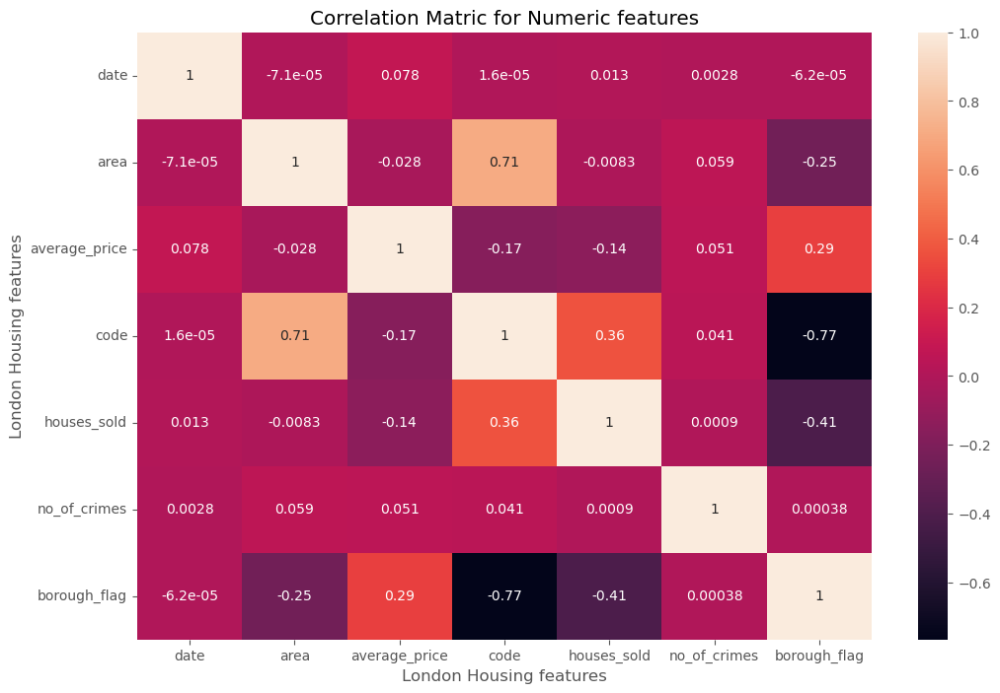

In [44]:
correlation_matrix = df_numerised.corr(method='pearson')

sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matric for Numeric features')

plt.xlabel('London Housing features')

plt.ylabel('London Housing features')

In [45]:
df_numerised.corr()

,date,area,average_price,code,houses_sold,no_of_crimes,borough_flag
date,1.000000,-0.000071,0.078436,0.000016,0.013263,0.002769,-0.000062
area,-0.000071,1.000000,-0.028351,0.708764,-0.008309,0.058942,-0.251566
average_price,0.078436,-0.028351,1.000000,-0.170986,-0.141349,0.050524,0.293271
code,0.000016,0.708764,-0.170986,1.000000,0.362045,0.041437,-0.765766
houses_sold,0.013263,-0.008309,-0.141349,0.362045,1.000000,0.000899,-0.413245
no_of_crimes,0.002769,0.058942,0.050524,0.041437,0.000899,1.000000,0.000378
borough_flag,-0.000062,-0.251566,0.293271,-0.765766,-0.413245,0.000378,1.000000


In [46]:
correlation_mat = df_numerised.corr()

corr_pairs = correlation_mat.unstack()

corr_pairs

date           date             1.000000
               area            -0.000071
               average_price    0.078436
               code             0.000016
               houses_sold      0.013263
               no_of_crimes     0.002769
               borough_flag    -0.000062
area           date            -0.000071
               area             1.000000
               average_price   -0.028351
               code             0.708764
               houses_sold     -0.008309
               no_of_crimes     0.058942
               borough_flag    -0.251566
average_price  date             0.078436
               area            -0.028351
               average_price    1.000000
               code            -0.170986
               houses_sold     -0.141349
               no_of_crimes     0.050524
               borough_flag     0.293271
code           date             0.000016
               area             0.708764
               average_price   -0.170986
               c

In [47]:
sorted_pairs = corr_pairs.sort_values()

sorted_pairs

code           borough_flag    -0.765766
borough_flag   code            -0.765766
               houses_sold     -0.413245
houses_sold    borough_flag    -0.413245
area           borough_flag    -0.251566
borough_flag   area            -0.251566
code           average_price   -0.170986
average_price  code            -0.170986
houses_sold    average_price   -0.141349
average_price  houses_sold     -0.141349
area           average_price   -0.028351
average_price  area            -0.028351
houses_sold    area            -0.008309
area           houses_sold     -0.008309
date           area            -0.000071
area           date            -0.000071
date           borough_flag    -0.000062
borough_flag   date            -0.000062
code           date             0.000016
date           code             0.000016
no_of_crimes   borough_flag     0.000378
borough_flag   no_of_crimes     0.000378
no_of_crimes   houses_sold      0.000899
houses_sold    no_of_crimes     0.000899
no_of_crimes   d

In [48]:
some_corr = sorted_pairs[(sorted_pairs)>0.05]

some_corr

no_of_crimes   average_price    0.050524
average_price  no_of_crimes     0.050524
no_of_crimes   area             0.058942
area           no_of_crimes     0.058942
average_price  date             0.078436
date           average_price    0.078436
borough_flag   average_price    0.293271
average_price  borough_flag     0.293271
code           houses_sold      0.362045
houses_sold    code             0.362045
area           code             0.708764
code           area             0.708764
date           date             1.000000
code           code             1.000000
houses_sold    houses_sold      1.000000
average_price  average_price    1.000000
area           area             1.000000
no_of_crimes   no_of_crimes     1.000000
borough_flag   borough_flag     1.000000
dtype: float64